# **Preparing Dependancies**

In [ ]:
!pip install diffusers transformers scipy ftfy accelerate safetensors

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.4 MB/s eta 0:00:00


In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from diffusers import (
    StableDiffusionPipeline,
    StableDiffusionInpaintPipeline,
    StableDiffusionXLPipeline,
    StableDiffusionXLImg2ImgPipeline,
)
from diffusers import EulerAncestralDiscreteScheduler, DPMSolverMultistepScheduler, DDIMScheduler
from diffusers.utils import load_image
from transformers import AutoProcessor, CLIPSegForImageSegmentation
from google.colab import userdata
from huggingface_hub import login
from PIL import Image, ImageDraw, ImageFilter

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


In [ ]:
token_hg=userdata.get('Hugging')
login(token=token_hg)

# **Kriteria 1: Melakukan Image Generation dari Teks (Text-to-Image)**

## **Load Base Pipeline Model**

In [ ]:
model_sd = "runwayml/stable-diffusion-v1-5"
# Pipeline
pipe = StableDiffusionPipeline.from_pretrained(
          model_sd,
          torch_dtype=torch.float16,
)
# If available Move to GPU
device = "cuda" if torch.cuda.is_available() else "cpu"
pipe.to(device)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:93: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.37.1",
  "_name_or_path": "stable-diffusion-v1-5/stable-diffusion-v1-5",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

## **Generate Image**

In [ ]:
def generate_simple_image(prompt, negative_prompt, seed):
  # Seed untuk menghasilkan gambar yang identik
  generator = torch.Generator(device).manual_seed(seed)

  # Generate
  image = pipe(
      prompt=prompt,
      negative_prompt=negative_prompt,
      generator=generator
  ).images[0]

  return image

  0%|          | 0/50 [00:00<?, ?it/s]

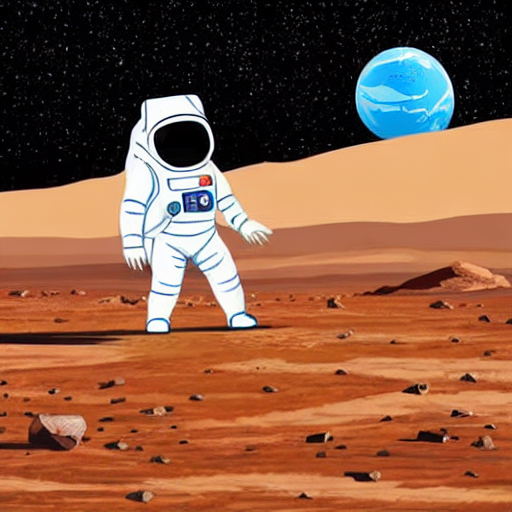

In [ ]:
generate_simple_image("An Astronaut landing on mars surface, cartoon digital illustration, walking half view pose on a martian surface, detail, sharp, highly detailed, complex shading, bold shapes, give a Sandy Clay color on mars surface, deep black starry space and blue realistic earth as the background on right side, with white spacesuit and black visor, small emblems on chest", "photorealistic, realistic, photograph, 3d render, messy, blurry, low quality, bad art, ugly, sketch, grainy, unfinished, chromatic aberration", 222)

## **Generate Image with Hyperparameter Configuration**

In [ ]:
# Advanced Function
def generate_advanced_image(prompt, negative_prompt, seed, guidance_scale, num_inference_steps):
  # Seed menghasilkan gambar yang identik
  generator = torch.Generator(device).manual_seed(222)

  # Generate
  image_advanced = pipe(
      prompt=prompt,
      negative_prompt=negative_prompt,
      generator=generator,
      guidance_scale=guidance_scale,
      num_inference_steps=num_inference_steps,
  ).images[0]

  return image_advanced

  0%|          | 0/50 [00:00<?, ?it/s]

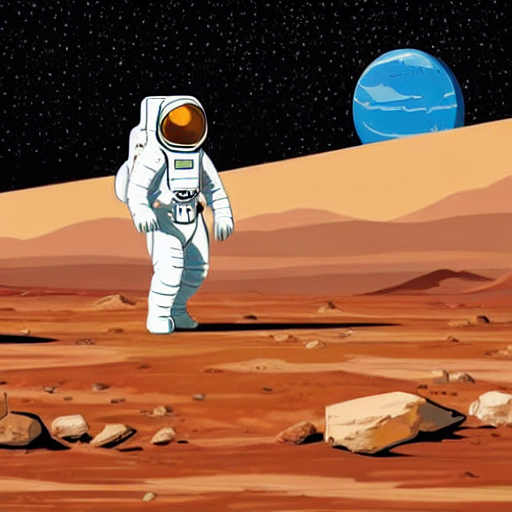

In [ ]:
generate_advanced_image("An Astronaut landing on mars surface, cartoon digital illustration, walking half view pose on a martian surface, detail, sharp, highly detailed, complex shading, bold shapes, give a Sandy Clay color on mars surface, deep black starry space and blue realistic earth as the background on right side, with white spacesuit and black visor, small emblems on chest", "photorealistic, realistic, photograph, 3d render, messy, blurry, low quality, bad art, ugly, sketch, grainy, unfinished, chromatic aberration", 222, 10, 50)

## **Guidance Scale Comparison**

  0%|          | 0/50 [00:00<?, ?it/s]

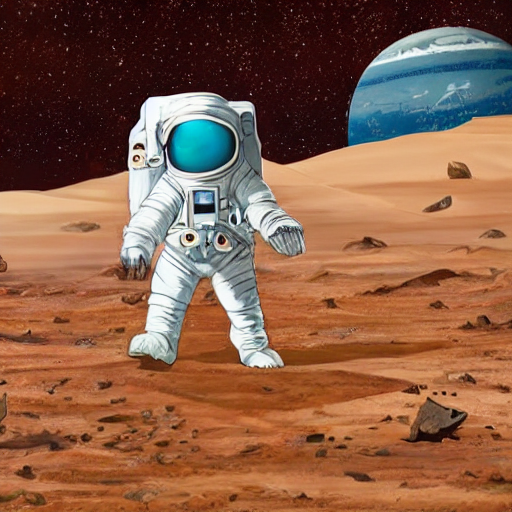

In [ ]:
# CFG RENDAH
generate_advanced_image("An Astronaut landing on mars surface, cartoon digital illustration, walking half view pose on a martian surface, detail, sharp, highly detailed, complex shading, bold shapes, give a Sandy Clay color on mars surface, deep black starry space and blue realistic earth as the background on right side, with white spacesuit and black visor, small emblems on chest", "photorealistic, realistic, photograph, 3d render, messy, blurry, low quality, bad art, ugly, sketch, grainy, unfinished, chromatic aberration", 222, 3, 50)

  0%|          | 0/50 [00:00<?, ?it/s]

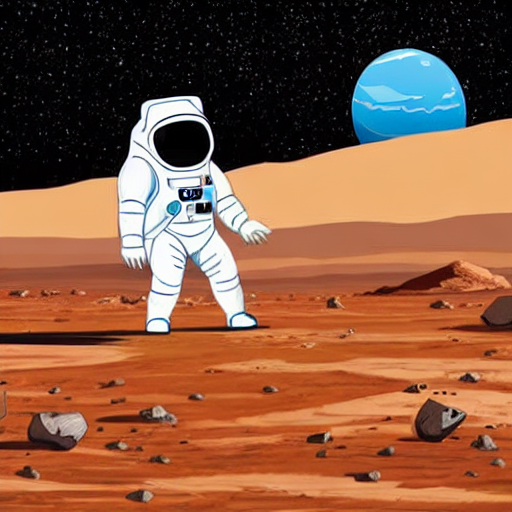

In [ ]:
# CFG TINGGI
generate_advanced_image("An Astronaut landing on mars surface, cartoon digital illustration, walking half view pose on a martian surface, detail, sharp, highly detailed, complex shading, bold shapes, give a Sandy Clay color on mars surface, deep black starry space and blue realistic earth as the background on right side, with white spacesuit and black visor, small emblems on chest", "photorealistic, realistic, photograph, 3d render, messy, blurry, low quality, bad art, ugly, sketch, grainy, unfinished, chromatic aberration", 222, 8, 50)

### **Guidance Scale Explanation:**

**Gambar dengan "Scale" Rendah:**   

*   Gambar yang dihasilkan cukup detail tetapi masih terlihat kasar dibeberapa bagian seperti permukaan mars, pakaian astronaut, planet bumi, namun ada beberapa bagian yang blur dan messy seperti tangan astronaut terlihat yang tidak berbentuk seperti tangan pada umumnya dan malah menyatu dengan permukaan mars
*  Gambar yang dihasilkan jika didasarkan pada prompting yang kita berikan, justru ada bagian yang tidak sesuai, seperti pada background luar angkasa yang dimana seharusnya berwarna hitam pekat malah menjadi warna merah.



---
**Gambar dengan "Scale" Tinggi:**   
*  Gambar yang dihasilkan justru lebih detail dan mengikuti bentuk prompt yang diminta jika dibandingkan dengan CFG rendah, dimana gambar yang dihasilkan juga tidak mengalami blur, messy separah CFG rendah.
*  Gambar yang dihasilkan juga sangat sesuai dengan prompting, terlebih di bagian background luar angkasa dimana dalam prompting diminta menghasilkan warna hitam pekat pada luar angkasa, berbeda dengan CFG rendah yang malah menghasilkan warna merah.



## **Inference Steps Comparison**

  0%|          | 0/10 [00:00<?, ?it/s]

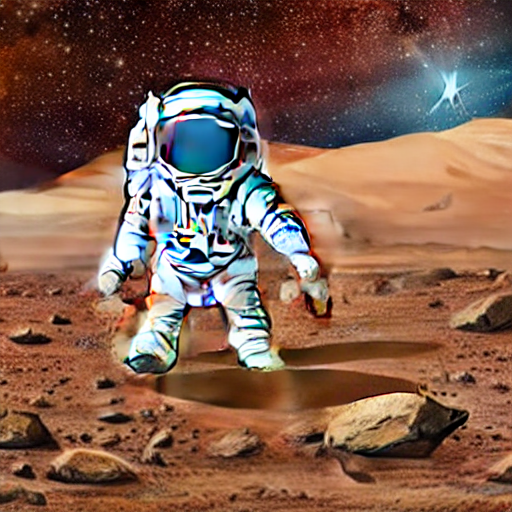

In [ ]:
# INFERENCE STEPS RENDAH
generate_advanced_image("An Astronaut landing on mars surface, cartoon digital illustration, walking half view pose on a martian surface, detail, sharp, highly detailed, complex shading, bold shapes, give a Sandy Clay color on mars surface, deep black starry space and blue realistic earth as the background on right side, with white spacesuit and black visor, small emblems on chest", "photorealistic, realistic, photograph, 3d render, messy, blurry, low quality, bad art, ugly, sketch, grainy, unfinished, chromatic aberration", 222, 8, 10)

  0%|          | 0/50 [00:00<?, ?it/s]

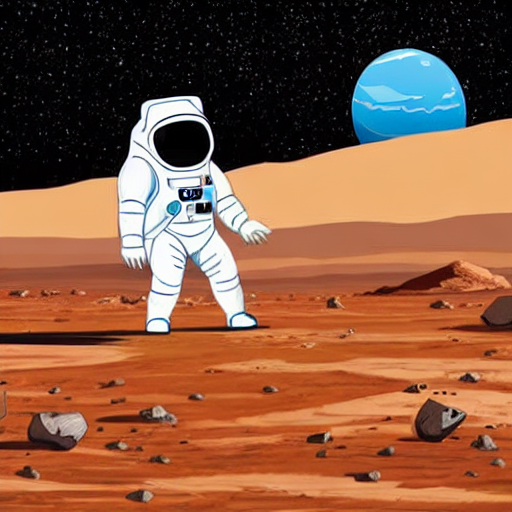

In [ ]:
# INFERENCE STEPS TINGGI
generate_advanced_image("An Astronaut landing on mars surface, cartoon digital illustration, walking half view pose on a martian surface, detail, sharp, highly detailed, complex shading, bold shapes, give a Sandy Clay color on mars surface, deep black starry space and blue realistic earth as the background on right side, with white spacesuit and black visor, small emblems on chest", "photorealistic, realistic, photograph, 3d render, messy, blurry, low quality, bad art, ugly, sketch, grainy, unfinished, chromatic aberration", 222, 8.0, 50)

### **Inference Step Explanation:**

**Gambar dengan "Step" Rendah:**   
*   Meskipun kita bisa menebak bentuk gambar yang dihasilkan, tetapi gambar tersebut masih sangat blur dan terlihat belum selesai di generate sepenuhnya
*   Pada objek astronaut dan juga permukaan mars yang masih ngeblur dan juga bentuk planet di background lebih terlihat seperti galaksi ketimbang planet, warna luar angkasa juga tercampur antara warna merah dan juga warna biru.

---

**Gambar dengan "Step" Tinggi:**  

*   Gambar yang dihasilkan memiliki visual yang tajam dan lebih halus dibandingkan gambar dengan step rendah
*   Objek seperti planet bumi, permukaan mars dan juga astronaut terbentuk dengan jelas dan detail, dan warna pada luar angkasa sekarang sudah sesuai menjadi warna hitam tidak tercampur seperti pada step rendah.

## **Batch Inference from One Prompt**

In [ ]:
def generate_batch_image(prompt, negative_prompt, seed, guidance_scale):
  image_batch = [] # Simpan gambar
  num_inference_steps = [10, 15, 20, 30] # Total iterasi yang dicoba

  # If available Move to GPU
  device = "cuda" if torch.cuda.is_available() else "cpu"
  pipe.to(device)

  for inference_steps in num_inference_steps:
    # Seed menghasilkan gambar yang identik
    generator = torch.Generator(device).manual_seed(seed)

    # Generate Gambar
    images = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        generator=generator,
        guidance_scale=guidance_scale,
        num_inference_steps=inference_steps,
    ).images

    #Simpan gambar hasil generate
    image_batch.append(images)

  plt.figure(figsize=(8, 8))
  for i, img in enumerate(image_batch):
    plt.subplot(2, 2, i + 1)
    plt.imshow(img)
    plt.title(f"Inference Steps: {num_inference_steps[i]}")
    plt.axis("off")

  plt.tight_layout()
  plt.show()

  return image_batch

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

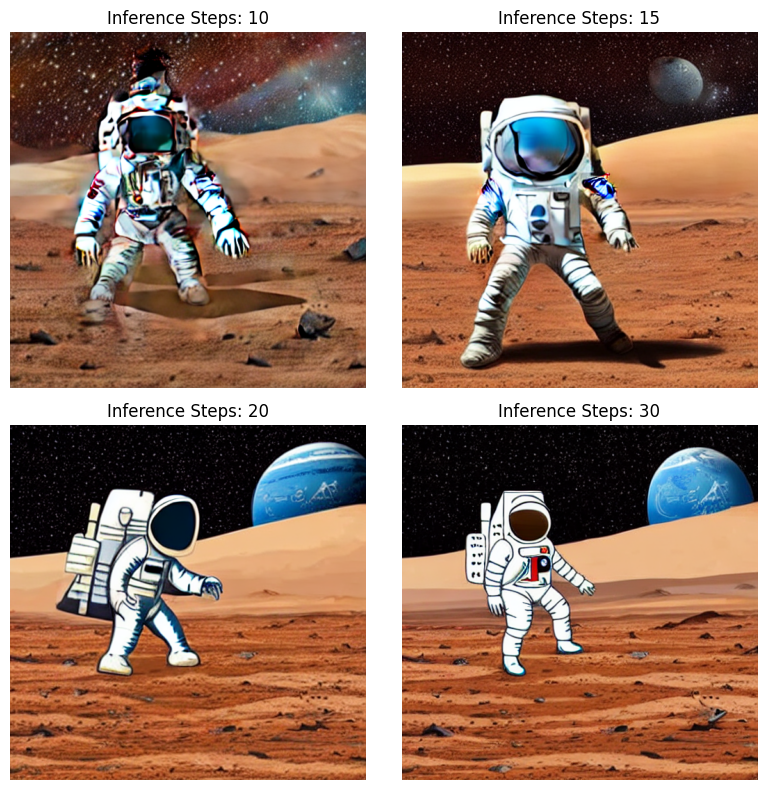

In [ ]:
gambar_batch = generate_batch_image("An Astronaut landing on mars surface, cartoon digital illustration, walking half view pose on a martian surface, detail, sharp, highly detailed, complex shading, bold shapes, give a Sandy Clay color on mars surface, deep black starry space and blue realistic earth as the background on right side, with white spacesuit and black visor, small emblems on chest", "photorealistic, realistic, photograph, 3d render, messy, blurry, low quality, bad art, ugly, sketch, grainy, unfinished, chromatic aberration", 222, 8)

## **Load Scheduler**

In [ ]:
def generate_image_scheduler(prompt, negative_prompt, seed, guidance_scale, num_inference_steps):
  image_scheduler = []

  # Scheduler Load
  Scheduler_configs = [
      (EulerAncestralDiscreteScheduler, "Euler a"),
      (DPMSolverMultistepScheduler, "DPM++ 2M Karras"),
      (DDIMScheduler, "DDIM")
  ]

  # If available Move to GPU
  device = "cuda" if torch.cuda.is_available() else "cpu"
  pipe.to(device)

  for scheduler_class, name in Scheduler_configs:
   pipe.scheduler = scheduler_class.from_config(pipe.scheduler.config)

   generator = torch.Generator(device).manual_seed(seed)

   # Generate Images
   image = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        generator=generator,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps,
   ).images[0]

   image_scheduler.append((name, image))

  plt.figure(figsize=(15, 8))
  for i, (name, image) in enumerate(image_scheduler):
    plt.subplot(1, 3, i + 1)
    plt.title(f"Scheduler: {name}")
    plt.imshow(image)
    plt.axis("off")

  plt.show()

  return image_scheduler

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

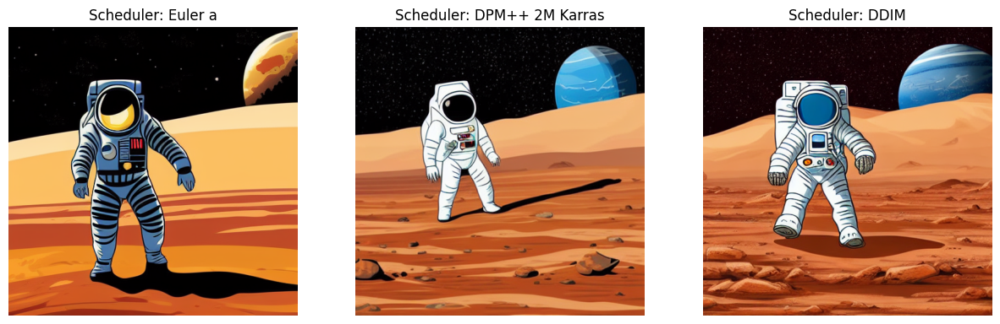

[('Euler a', <PIL.Image.Image image mode=RGB size=512x512>),
 ('DPM++ 2M Karras', <PIL.Image.Image image mode=RGB size=512x512>),
 ('DDIM', <PIL.Image.Image image mode=RGB size=512x512>)]

In [ ]:
generate_image_scheduler("An Astronaut landing on mars surface, cartoon digital illustration, walking half view pose on a martian surface, detail, sharp, highly detailed, complex shading, bold shapes, give a Sandy Clay color on mars surface, deep black starry space and blue realistic earth as the background on right side, with white spacesuit and black visor, small emblems on chest", "photorealistic, realistic, photograph, 3d render, messy, blurry, low quality, bad art, ugly, sketch, grainy, unfinished, chromatic aberration", 222, 8, 20)

### **Scheduler Comparation:**

**Gambar dengan "Euler A Scheduler":**  
*   Gambar yang dihasilkan terlihat sangat detail dan halus dari segi pemberian shadow pada objek pun sangat halus mengikuti struktur dari planet mars, tetapi warna planet yang dihasilkan tidak sesuai dengan prompting yang diberikan, ini disebabkan karena scheduler yang berakhiran A seperti Euler A menghapus noise tetapi memberikan sedikit noise pada setiap steps.
---
**Gambar dengan "DPM++ Scheduler":**  
*   Gambar yang dihasilkan cukup detail dan juga sesuai dengan jenis prompting yang diberikan, tetapi jika dilihat lebih detail gambar yang dihasilkan sedikit blur
---
**Gambar dengan "DDIM Scheduler":**  
*   Gambar yang dihasilkan jika dilihat dari tekstur permukaan mars, planet yang di background sudah sangat detail tetapi pada objek astronaut tangan dan kaki yang dihasilkan tidak sesuai, dimana warna tangan dan kaki astronaut berbeda dengan warna spacesuit yang dikenakan, dan juga warna luar angkasa yang agak kemerahan dimana seharusnya berwarna hitam pekat.

# **Kriteria 2: Menyempurnakan Gambar Melalui Image-to-Image**

## **Base + Refiner Image Generation**

In [ ]:
def generate_img2img(prompt, new_prompt, negative_prompt, seed, guidance_scale, num_inference_steps, auto_download=True):
  # Load Model
  model_sdxl = "stabilityai/stable-diffusion-xl-base-1.0"

  # Load Pipeline Text-to-Img
  pipe_text2img=StableDiffusionXLPipeline.from_pretrained(
      model_sdxl,
      torch_dtype=torch.float16,
  )
  # If available Move to GPU
  device = "cuda" if torch.cuda.is_available() else "cpu"
  pipe_text2img.to(device)

  # Seed untuk menghasilkan gambar yang identik
  generator = torch.Generator(device).manual_seed(seed)

  # Generate Gambar
  image_base = pipe_text2img(
      prompt=prompt,
      negative_prompt=negative_prompt,
      generator=generator,
      guidance_scale=guidance_scale,
      num_inference_steps=num_inference_steps,
      denoising_end=0.8,
      output_type="latent"
   ).images[0]

  # Load Pipeline
  print("Setup Refiner......")
  pipe_img2img=StableDiffusionXLImg2ImgPipeline.from_pretrained(
      model_sdxl,
      vae=pipe_text2img.vae,
      text_encoder=pipe_text2img.text_encoder,
      tokenizer=pipe_text2img.tokenizer,
      unet=pipe_text2img.unet,
      torch_dtype=torch.float16
  )
  pipe_img2img.to(device)

  # Terima Input Gambar
  image_refiner = pipe_img2img(
      prompt=new_prompt,
      negative_prompt=negative_prompt,
      image=image_base,
      generator=generator,
      guidance_scale=guidance_scale,
      denoising_start=0.8,
      num_inference_steps=num_inference_steps
  ).images[0]

  # Bersihin cache memori GPU
  del pipe_img2img
  torch.cuda.empty_cache()

  if auto_download==True:
    image_refiner.save("astronaut.png")

  return image_refiner

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:93: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/517 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

Setup Refiner......


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/517 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/diffusers/pipelines/stable_diffusion_xl/pipeline_stable_diffusion_xl_img2img.py:896: FutureWarning: `upcast_vae` is deprecated and will be removed in version 1.0.0. `upcast_vae` is deprecated. Please use `pipe.vae.to(torch.float32)`. For more details, please refer to: https://github.com/huggingface/diffusers/pull/12619#issue-3606633695.
  deprecate(


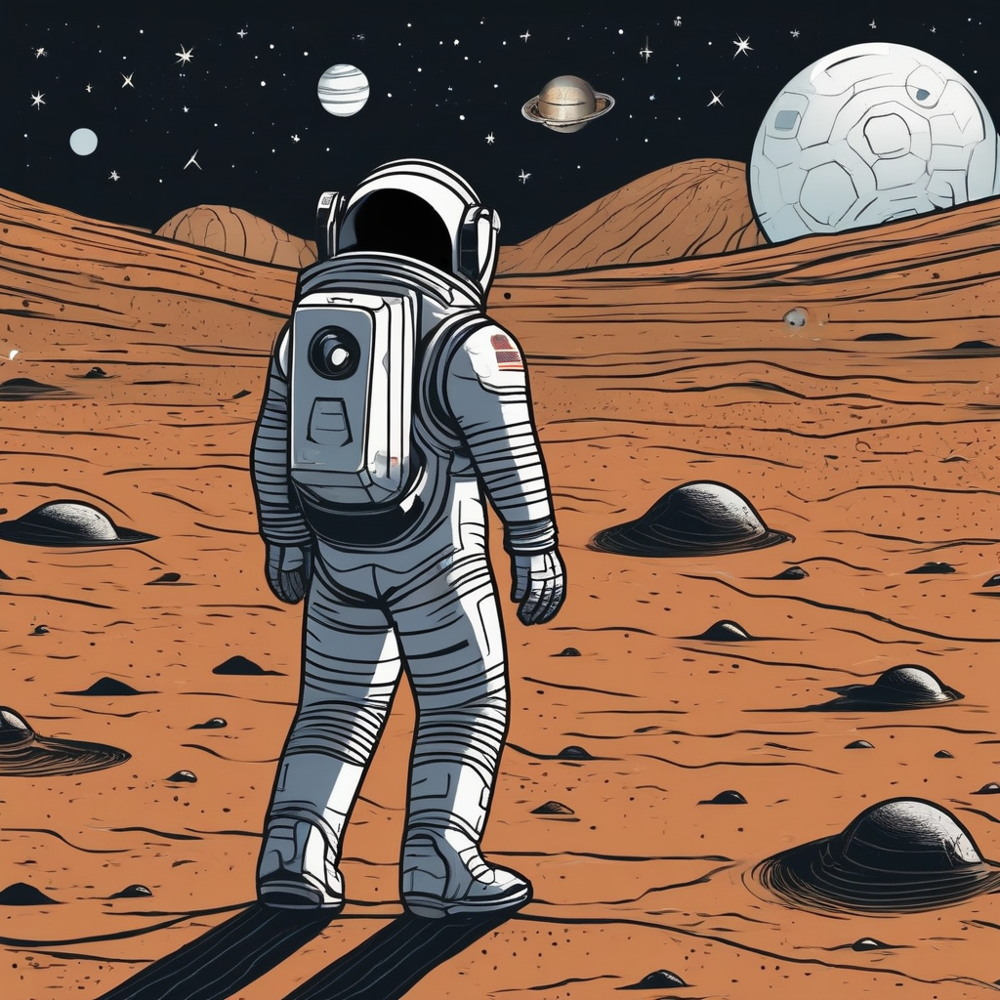

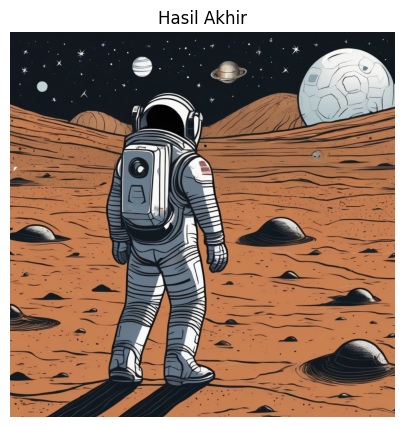

In [ ]:
generate_img2img("An Astronaut landing on mars surface, cartoon digital illustration, walking half view pose on a martian surface, detail, sharp, highly detailed, complex shading, bold shapes, give a Sandy Clay color on mars surface, deep black starry space and blue realistic earth as the background on right side, with white spacesuit and black visor, small emblems on chest", "Added Broken Satellite Near An Astronaut", "photorealistic, realistic, photograph, 3d render, messy, blurry, low quality, bad art, ugly, sketch, grainy, unfinished, chromatic aberration", 222, 8, 30)

## **Inpainting**

### **Load Model Inpainting**

In [ ]:
model_sd = "runwayml/stable-diffusion-inpainting"

# Pipeline Inpainting
pipe_inpainting = StableDiffusionInpaintPipeline.from_pretrained(
    model_sd,
    torch_dtype=torch.float16,
)
# If available Move to GPU
device = "cuda" if torch.cuda.is_available() else "cpu"
pipe_inpainting.to(device)

# Slicing per piksel
pipe_inpainting.enable_attention_slicing()
# Generator Seed
generator = torch.Generator(device).manual_seed(9)

model_index.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /

### **Manual Masking**

Downloading...
From: https://drive.google.com/uc?id=1UK6jUI86Gzdz9oNgSXJ0tXZVS4WA73v8
To: /content/astronaut.png
100% 395k/395k [00:00<00:00, 120MB/s]


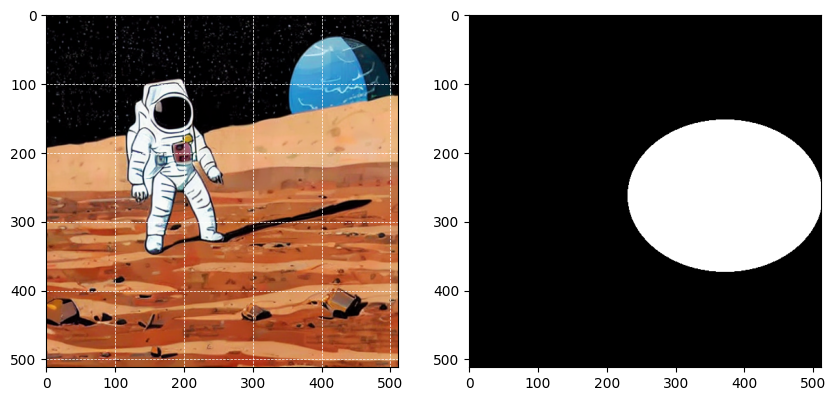

In [ ]:
# Download gambar yang di inpainting
image_url = "https://drive.google.com/file/d/1UK6jUI86Gzdz9oNgSXJ0tXZVS4WA73v8/view?usp=drive_link"
!gdown {image_url} -O astronaut.png --fuzzy

# Load Gambar, convert ke RGB, ubah ukuran menjadi 512 x 512
init_image = Image.open("astronaut.png").convert("RGB").resize((512, 512))

# Buat masking
masking = Image.new("L", init_image.size, 0)
draw = ImageDraw.Draw(masking)

# Koordinat masking
width, height = init_image.size
left = width * 0.45
top = height * 0.3
right = width * 1.0
bottom = height * 0.73

# bentuk mask
draw.ellipse((left, top, right, bottom), fill=255)

# Posisi Gambar asli
plt.figure(figsize=(10, 5))
plt.subplot(1,2,1)
plt.imshow(init_image)
plt.grid(color="white", linestyle="--", linewidth=0.5)

plt.subplot(1,2,2)
plt.imshow(masking, cmap='gray')
plt.show()

### **Generate**

In [ ]:
def inpaint_engine(prompt, image, mask):
  # Generate
  images = pipe_inpainting(
      prompt=prompt,
      negative_prompt="sand only, empty ground, messy, blurry, low resolution, bad anatomy, realistic photo",
      image=image,
      mask_image=mask,
      strength=1.0,
      num_inference_steps=40,
      guidance_scale=10,
      generator=generator
  ).images[0]

  return images

In [ ]:
gambar_inpaint = inpaint_engine("(((A broken satellite stand with mechanical landing gear on mars surface))), turquoise color on triagle solar panel, gold antenna above the satellite , digital illustrastion, clear shapes, complex shadowing", init_image, masking)

  0%|          | 0/40 [00:00<?, ?it/s]

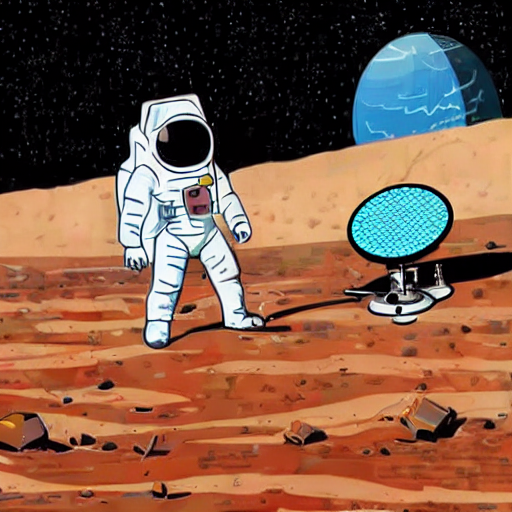

In [ ]:
gambar_inpaint

## **Inpainting Menggunakan Automasking**

### **load Model Segmentation Untuk Masking**

In [ ]:
# Load Model Segmentation
model_seg = "CIDAS/clipseg-rd64-refined"
processor = AutoProcessor.from_pretrained(model_seg)

pipe_seg = CLIPSegForImageSegmentation.from_pretrained(
    model_seg,
    torch_dtype=torch.float16
)
# Move to GPU
device = "cuda" if torch.cuda.is_available() else "cpu"
pipe_seg.to(device)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:93: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/380 [00:00<?, ?B/s]

The image processor of type `ViTImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/974 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/603M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/462 [00:00<?, ?it/s]

CLIPSegForImageSegmentation LOAD REPORT from: CIDAS/clipseg-rd64-refined
Key                                       | Status     |  | 
------------------------------------------+------------+--+-
clip.text_model.embeddings.position_ids   | UNEXPECTED |  | 
clip.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


CLIPSegForImageSegmentation(
  (clip): CLIPSegModel(
    (text_model): CLIPSegTextTransformer(
      (embeddings): CLIPSegTextEmbeddings(
        (token_embedding): Embedding(49408, 512)
        (position_embedding): Embedding(77, 512)
      )
      (encoder): CLIPSegEncoder(
        (layers): ModuleList(
          (0-11): 12 x CLIPSegEncoderLayer(
            (self_attn): CLIPSegAttention(
              (k_proj): Linear(in_features=512, out_features=512, bias=True)
              (v_proj): Linear(in_features=512, out_features=512, bias=True)
              (q_proj): Linear(in_features=512, out_features=512, bias=True)
              (out_proj): Linear(in_features=512, out_features=512, bias=True)
            )
            (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
            (mlp): CLIPSegMLP(
              (activation_fn): QuickGELUActivation()
              (fc1): Linear(in_features=512, out_features=2048, bias=True)
              (fc2): Linear(in_features=20

### **Masking with Segmentation Model**

In [ ]:
def generate_automasking(image, prompt):
  # Ubah gambar menjadi hitam putih berdasarkan prompt
  inputs = processor(
      text=prompt,
      images=[image],
      padding="max_length",
      return_tensors="pt"
  )

  # Ubah pixel ke float16
  inputs["pixel_values"] = inputs["pixel_values"].to(device, dtype=torch.float16)
  inputs['input_ids'] = inputs['input_ids'].to(device)
  inputs['attention_mask'] = inputs['attention_mask'].to(device)

  with torch.inference_mode():
    outputs = pipe_seg(**inputs)

  # ubah ke float32
  preds = outputs.logits.unsqueeze(1)
  pred_mask = torch.sigmoid(preds[0][0]).cpu().to(torch.float32).numpy()

  # Normalisasi skala warna menjadi hitam putih
  pred_mask = (pred_mask - pred_mask.min()) / (pred_mask.max() - pred_mask.min())
  pred_mask = (pred_mask * 255).astype(np.uint8)

  # Ubah gambar ke ukuran asli
  mask_image = Image.fromarray(pred_mask, mode="L").resize(image.size)

  return mask_image

### **Generate**

Downloading...
From: https://drive.google.com/uc?id=1UK6jUI86Gzdz9oNgSXJ0tXZVS4WA73v8
To: /content/astronaut.png
100% 395k/395k [00:00<00:00, 115MB/s]


/tmp/ipykernel_962/756556286.py:27: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  mask_image = Image.fromarray(pred_mask, mode="L").resize(image.size)


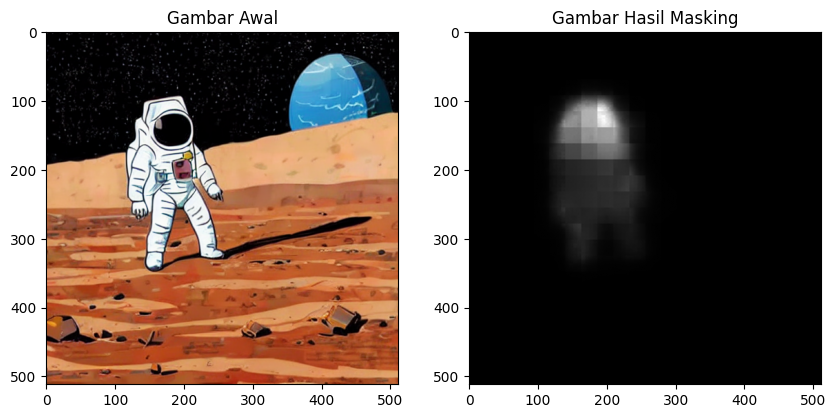

In [ ]:
image_url = "https://drive.google.com/file/d/1UK6jUI86Gzdz9oNgSXJ0tXZVS4WA73v8/view?usp=drive_link"
!gdown {image_url} -O astronaut.png --fuzzy
gambar = Image.open("astronaut.png").convert("RGB").resize((512, 512))

hasil_masking = generate_automasking(gambar, "An Astronaut")

plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.title("Gambar Awal")
plt.imshow(gambar)

plt.subplot(1,2,2)
plt.title("Gambar Hasil Masking")
plt.imshow(hasil_masking, cmap="gray")
plt.show()

## **Outpainting**

### **Prepare the Canvas**

In [ ]:
def prepare_outpainting(base_image):
  old_width, old_height = base_image.size
  new_width = old_width + 256

  # Kanvas baru
  outpainting_image = Image.new("RGB", (new_width, old_height))
  outpainting_image.paste(base_image, (0, 0))

  # Masking
  outpainting_mask = Image.new("L", (new_width, old_height), 255)
  original_area_mask = Image.new("L", (old_width, old_height), 0)
  outpainting_mask.paste(original_area_mask, (0, 0))

  # Show image
  plt.figure(figsize=(15, 6))
  plt.subplot(1,2,1)
  plt.title("Gambar Awal Hasil Inpainting")
  plt.imshow(base_image)

  plt.subplot(1,2,2)
  plt.title("Menambahkan Area Outpainting")
  plt.imshow(outpainting_image)
  plt.tight_layout()
  plt.show()

  return outpainting_image, outpainting_mask

### **Generate**

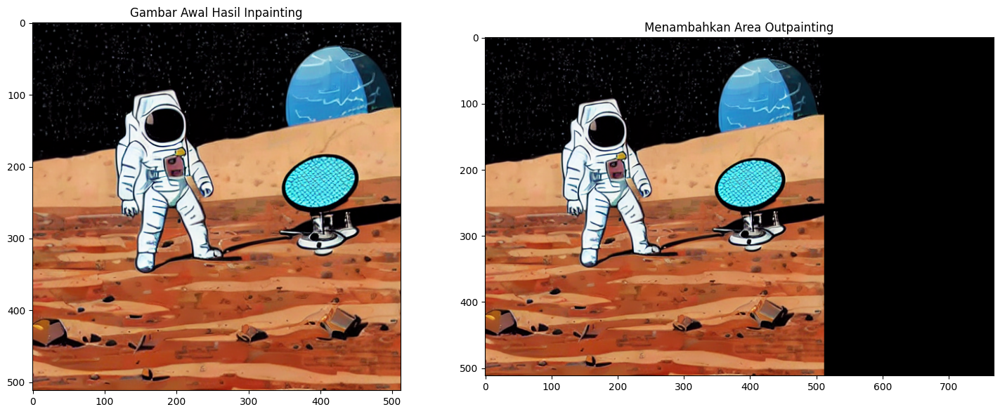

In [ ]:
canvas, outpainting_masking = prepare_outpainting(gambar_inpaint)

  0%|          | 0/40 [00:00<?, ?it/s]

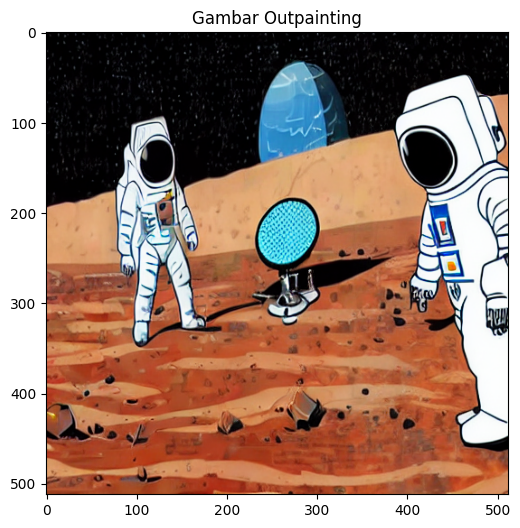

In [ ]:
hasil_outpainting = inpaint_engine("(((Two Astronauts))) facing each other doing vew pose standing on crashed broken satellite, with shiny grey moon planet moon in background behind mars mountain near left giant earth in the deep black starry space digital illustration, highly detailed, complex shader, shadowing, crips lines)", canvas, outpainting_masking)

plt.figure(figsize=(15, 6))
plt.title("Gambar Outpainting")
plt.imshow(hasil_outpainting)
plt.show()

## **Outpainting Zoom Out**

### **Prepare Canvas for Zoom Out**

In [ ]:
def zoom_out(image, expand_pixel=128):
  # Copy ukuran asli
  width, height = image.size

  # Ukuran kanvas baru
  new_width = width + expand_pixel
  new_height = height + expand_pixel

  # Ubah resolusi kelipatan 8
  new_width = new_width - (new_width % 8)
  new_height = new_height - (new_height % 8)

  # Blur background
  background = image.resize((new_width, new_height), resample=Image.BICUBIC)
  background = background.filter(ImageFilter.GaussianBlur(radius=50))

  # Simpan gambar asli ditengah kanvas yang di blur
  paste_x = (new_width - width) // 2
  paste_y = (new_height - height) // 2
  background.paste(image, (paste_x, paste_y))

  # Masking area(Hitam = Simpan, Putih = Edit)
  mask = Image.new("L", (new_width, new_height), 255)
  inner_box = Image.new("L", (width, height), 0)

  # Gabungkan masking dengan gambar asli
  mask.paste(inner_box, (paste_x, paste_y))

  return mask, background

### **Generate**

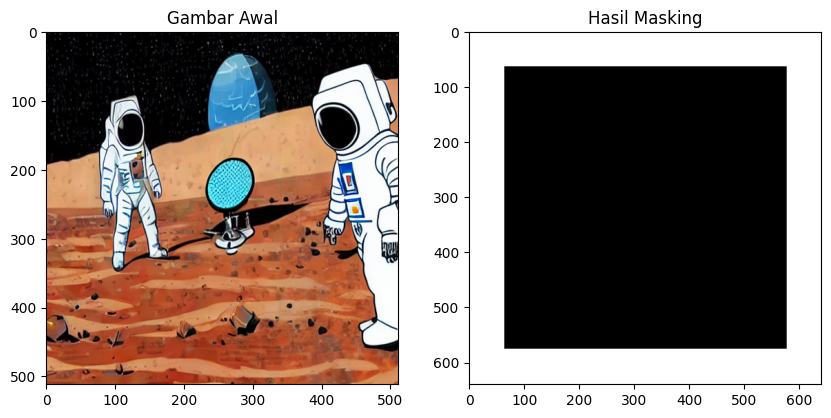

In [ ]:
# Hasilkan ukuran baru
masking, gambar = zoom_out(hasil_outpainting)

plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1)
plt.title("Gambar Awal")
plt.imshow(hasil_outpainting)

plt.subplot(1, 2, 2)
plt.title("Hasil Masking")
plt.imshow(masking, cmap='gray')
plt.show()

  0%|          | 0/40 [00:00<?, ?it/s]

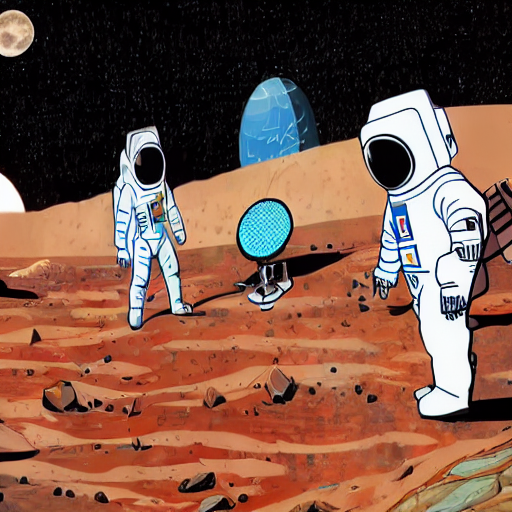

In [ ]:
# Hasil outpainting
inpaint_engine("A mars landscape and moon in the background starry space, digital illustrastion, highly detailed, shadowing, grey color on moon", gambar, masking)